### Applying Sharpening spatial filters for blurring reduction using Laplacian Filter

In [1]:
import cv2
from PIL import Image
import numpy as np

(450, 600)


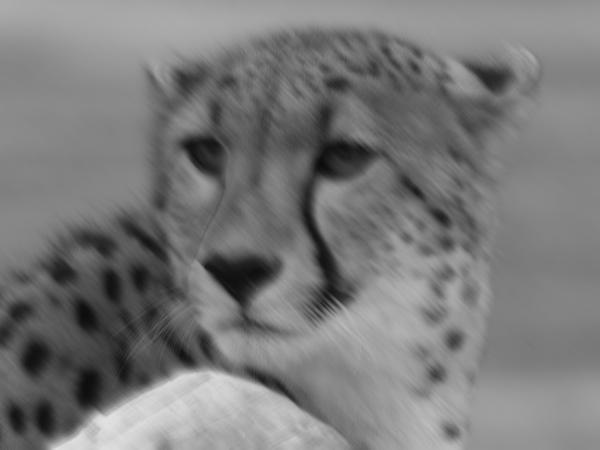

In [2]:
img = cv2.imread('bimage3.jpg', 2)
print img.shape
Image.fromarray(img)

### Generic function that does the spatial filtering depending on the filter that is provided

In [3]:
def spatialfilter(img, arrayfilter):
    #imgshow = Image.fromarray(img)
    #imgshow.show()
    
    newimg          = img.copy()
    [height, width] = img.shape
    [filtersize, a] = arrayfilter.shape
    b               = (a-1) / 2 # b is the steps needed to get to the center of the arrayfilter index and like wise
    

    for y in range(height):
        for x in range(width):
            endy = a+y
            endx = a+x
            if endy < height and endx < width: # Taking boundaries into account and ignoring them 
                arraytemp    = np.multiply(arrayfilter, img[y:endy, x:endx])
                newimg[y+b][x+b] = arraytemp.sum()
    
    newimgshow = Image.fromarray(newimg)
    #newimgshow.show()
    return newimgshow

##### Refer to slide 38 and 41 for knowledge on filters

In [4]:
arrayfilter  = np.array([[0, -1, 0],
                      [-1, 5, -1],
                      [0, -1, 0]])
#print arrayfilter

arrayfilterN = np.array([[-1, -1, -1],
                        [-1, 9, -1],
                        [-1, -1, -1]])
#print arrayfilterN

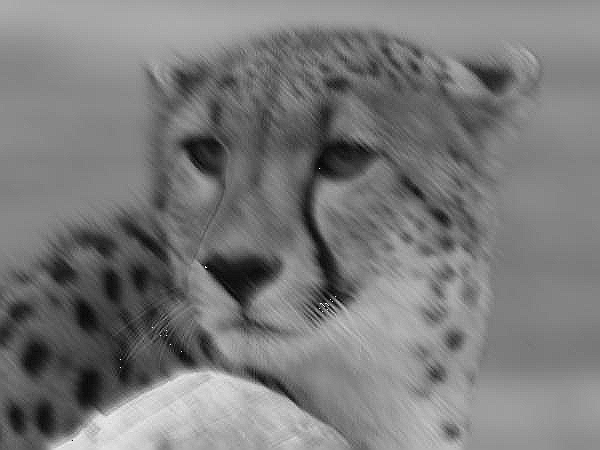

In [5]:
spatialfilter(img, arrayfilter)

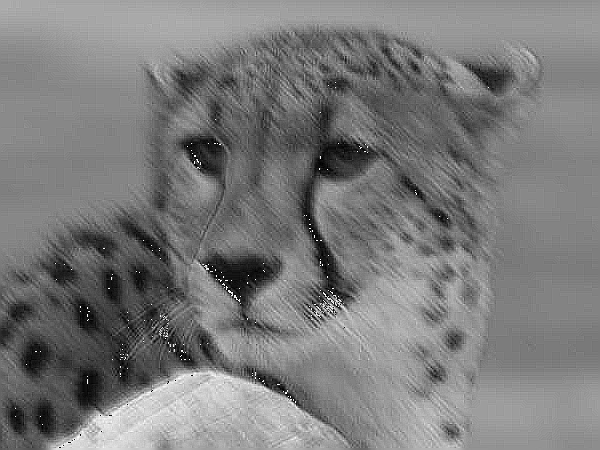

In [6]:
spatialfilter(img, arrayfilterN)

(2160, 4096)


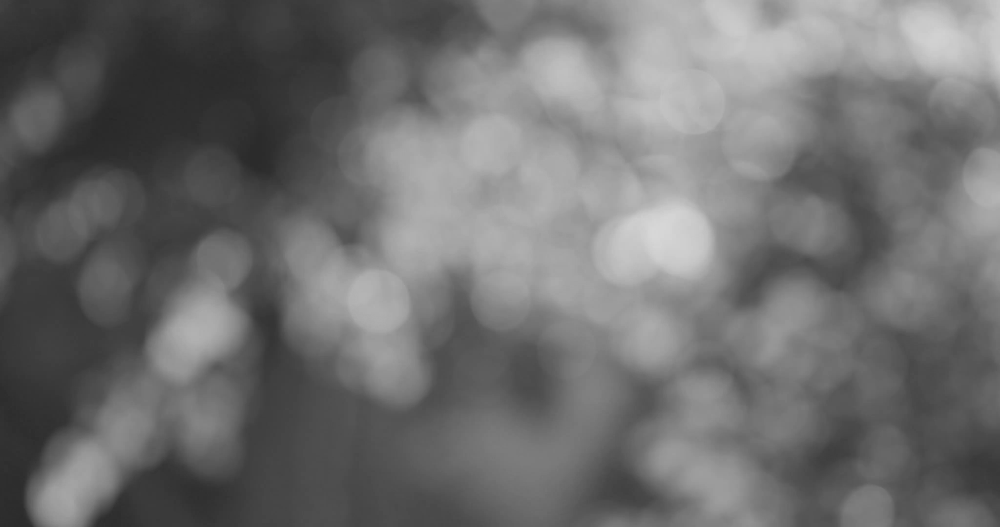

In [7]:
img2 = cv2.imread("bimage.png", 2)
print img2.shape
Image.fromarray(img2)

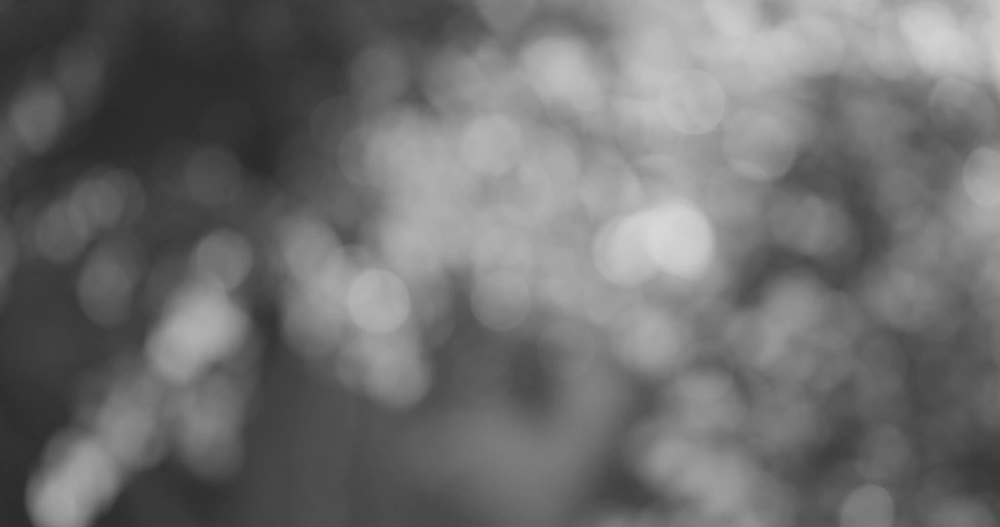

In [8]:
spatialfilter(img2, arrayfilter)

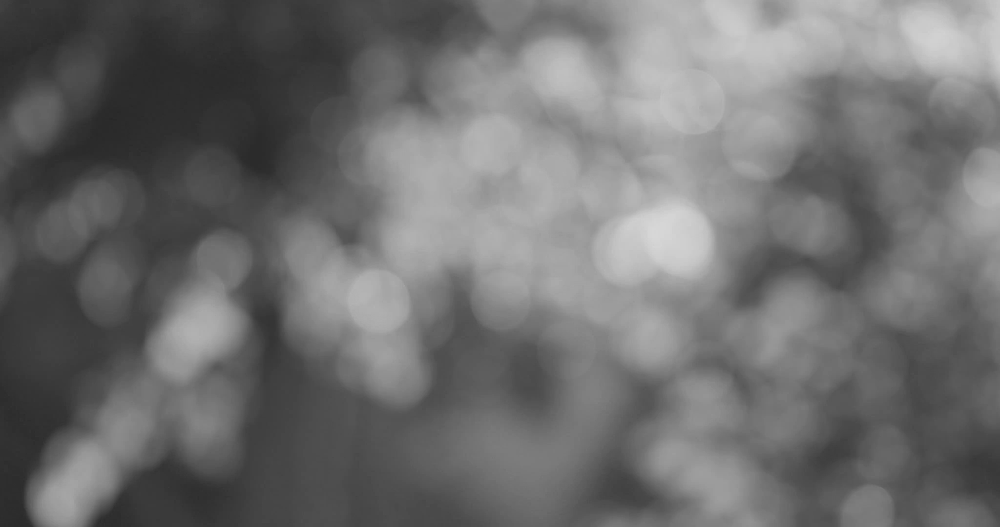

In [9]:
spatialfilter(img2, arrayfilterN)

(1080, 1920)


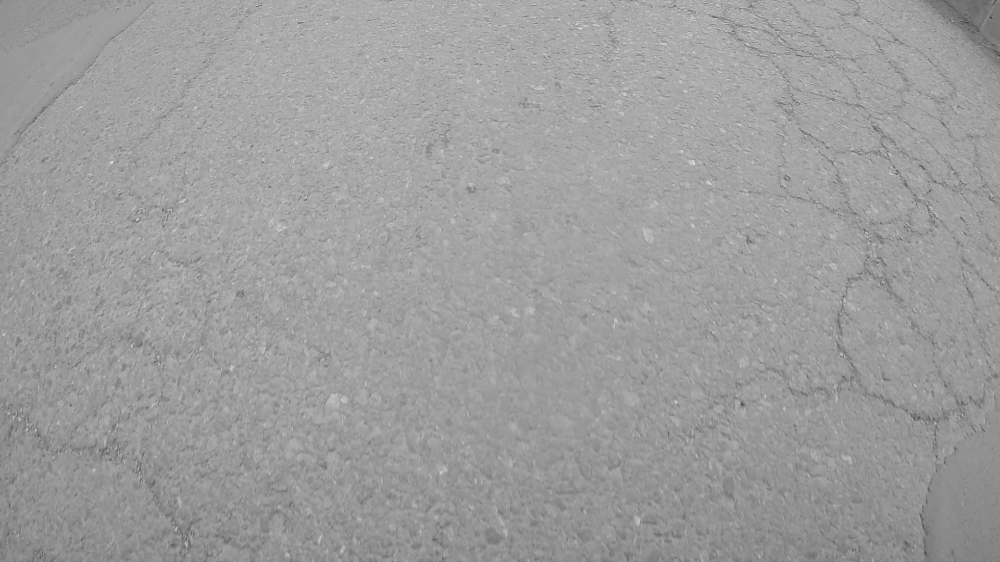

In [11]:
imgRoad = cv2.imread("GOPR8471 250.jpg",2)
print(imgRoad.shape)
Image.fromarray(imgRoad)

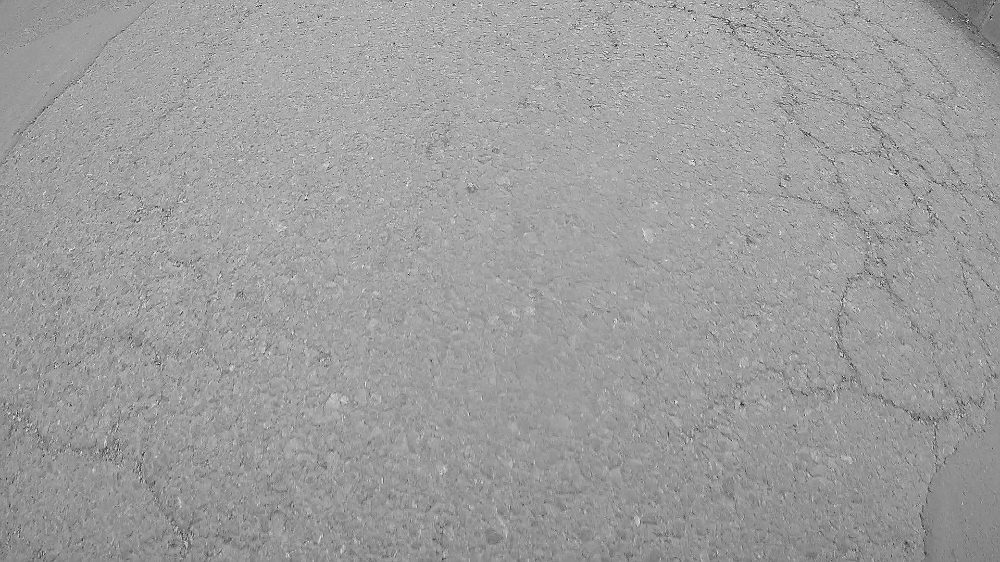

In [12]:
spatialfilter(imgRoad, arrayfilter)

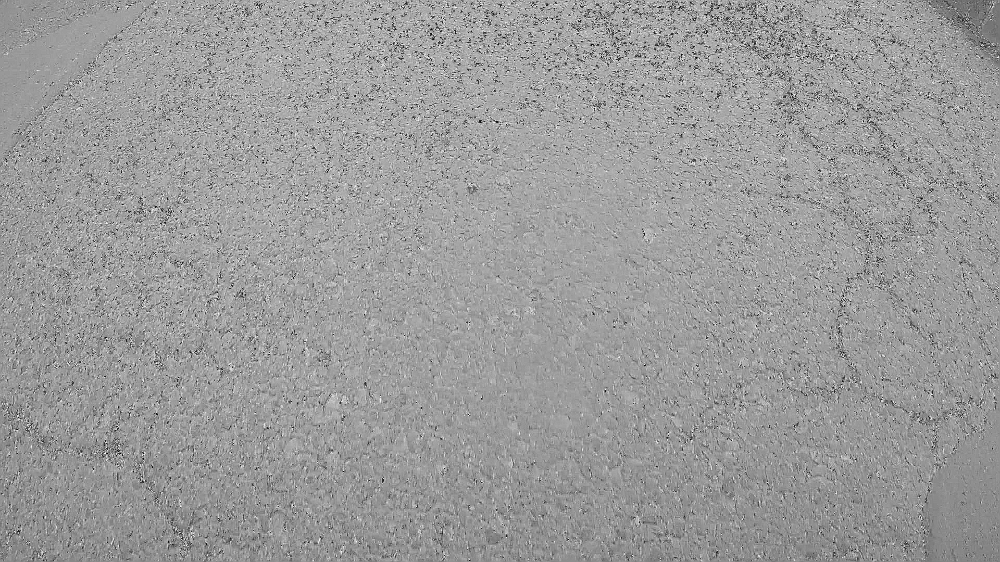

In [13]:
spatialfilter(imgRoad, arrayfilterN)

##### Commented out. This was a linear approach
arraytemp       = np.zeros((9,9), np.int16)
[a,b]           = arraytemp.shape
b               = (a-1) / 2
#Refer to slide 15
aaxis           = np.linspace(-b,b,a).astype(np.int8)
baxis           = np.linspace(-b,b,a).astype(np.int8)
aaxis

for y in range(height):
    for x in range(width):
        
        for s in aaxis:
            for t in baxis:
                
                if (y+s) < 0 and (x+t) < 0:
                    temp = img[y][x]
                elif (y+s) >= height and (x+t) >= width:
                    temp = img[y][x]
                elif (y+s) < 0 and (x+t) < width:
                    temp = img[y][x+t]
                elif (x+t) < 0 and (y+s) < height:
                    temp = img[y+s][x]
                elif (y+s) >= height and (x+t) < width:
                    temp = img[y][x+t]
                elif (x+t) >= width and (y+s) < height:
                    temp = img[y+s][x]                    
                else:
                    temp = img[y+s][x+t]
                    
                arraytemp[s+b][t+b] = arrayfilter[s+b][t+b] * temp
        
        newimg[y][x] = arraytemp.sum()
    print y                
                
        